# Border Limits

9 July, 2024

@roman

In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from tqdm import tqdm
import h3
import os

from scipy.spatial import KDTree
import scipy.sparse as sp
from scipy import io
from sklearn.cluster import MiniBatchKMeans, SpectralClustering, HDBSCAN
from INEGIpy import MarcoGeoestadistico

In [2]:
# Settings
# show 100 columns in pandas
pd.set_option('display.max_columns', 100)
geo_framework = MarcoGeoestadistico()

---
# Data

## Properties

In [3]:
# read parquet
gdf_properties = pd.read_parquet("../../data/interim/cleaned_data_s6.parquet")

# to geopandas
gdf_properties = gpd.GeoDataFrame(
    gdf_properties,
    geometry=gpd.points_from_xy(gdf_properties['longitud'], gdf_properties['latitud']),
    crs="EPSG:4326"
    )

# change crs to 6372
gdf_properties = gdf_properties.to_crs("EPSG:6372")

gdf_properties.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 852913 entries, 0 to 852912
Data columns (total 55 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   property_id                    852913 non-null  object        
 1   valor_fisico_construccion      852913 non-null  float64       
 2   id_avaluo                      852913 non-null  object        
 3   fecha_avaluo                   852913 non-null  datetime64[ns]
 4   colonia                        852913 non-null  object        
 5   id_clase_inmueble              852913 non-null  int64         
 6   id_tipo_inmueble               852913 non-null  int64         
 7   conservacion                   852913 non-null  float64       
 8   elevador                       824546 non-null  float64       
 9   niveles                        852913 non-null  int64         
 10  cve_ref_proximidad_urbana      852913 non-null  int64       

## Ocean Geometries

In [4]:
# read ocean geometries
gdf_mexico_oceans = gpd.read_file("../../data/catalogues/mexico_shapes/regionmarinamx")

# vars 2 stay
vars_to_stay = [
    'etiqueta', 'geometry'
]

# normalize etiqueta: remove special characters of latin to utf8
gdf_mexico_oceans['etiqueta'] = gdf_mexico_oceans['etiqueta'].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')
# to lower and trim
gdf_mexico_oceans['etiqueta'] = gdf_mexico_oceans['etiqueta'].str.lower().str.strip()
# replace spaces with _
gdf_mexico_oceans['etiqueta'] = gdf_mexico_oceans['etiqueta'].str.replace(" ", "_")

# get only vars to stay
gdf_mexico_oceans = gdf_mexico_oceans[vars_to_stay]

# see
print(gdf_mexico_oceans.shape)
gdf_mexico_oceans

(5, 2)


,etiqueta,geometry
0,mar_caribe,"MULTIPOLYGON (((-87.84135 18.24767, -87.84300 ..."
1,golfo_de_california,"POLYGON ((-110.82716 27.95587, -110.82710 27.9..."
2,pacifico_noroeste,"POLYGON ((-117.25925 32.60027, -117.21526 32.5..."
3,pacifico_tropical,"POLYGON ((-105.67655 20.34785, -105.67643 20.3..."
4,golfo_de_mexico,"POLYGON ((-93.39727 25.97991, -93.41794 25.806..."


<Axes: >

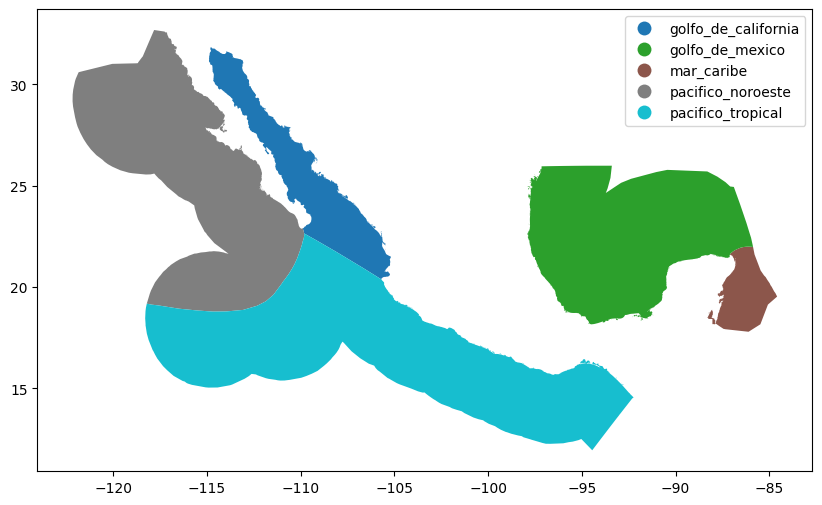

In [5]:
# plot ocean geometries color by REGIONMAR
gdf_mexico_oceans.plot(column="etiqueta", legend=True, figsize=(10, 10))

In [6]:
# buffer ocean geometries 2 km
gdf_mexico_oceans_buffered = gdf_mexico_oceans.copy()

# change to crs 6372
gdf_mexico_oceans_buffered = gdf_mexico_oceans_buffered.to_crs("EPSG:6372")
gdf_mexico_oceans_buffered["geometry"] = gdf_mexico_oceans_buffered["geometry"].buffer(1_000)

# plot ocean geometries color by REGIONMAR
gdf_mexico_oceans_buffered.explore(column="etiqueta", legend=True, figsize=(10, 10))

## Mexico Borders (WIP)

In [7]:
# # get mexico shape
# gdf_mex_states = geo_framework.Entidades()
# gdf_mex_states.plot()

In [8]:
# # get only the contours of mexico
# gdf_mex_boundary = gdf_mex_states.unary_union
# gdf_mex_boundary = gpd.GeoDataFrame(geometry=[gdf_mex_boundary], crs="EPSG:4236")
# gdf_mex_boundary = gdf_mex_boundary.boundary
# gdf_mex_boundary = gpd.GeoDataFrame(geometry=gdf_mex_boundary, crs="EPSG:4236")

In [9]:
# # plot
# gdf_mex_boundary.plot()

In [10]:
# # buffer mexico boundary 2 km
# gdf_mex_boundary_buffered = gdf_mex_boundary.copy()
# gdf_mex_boundary_buffered = gdf_mex_boundary_buffered.to_crs("EPSG:6372")
# gdf_mex_boundary_buffered["geometry"] = gdf_mex_boundary_buffered["geometry"].buffer(1_000)
# gdf_mex_boundary_buffered.plot()

---
# Match Properties

## Find properties near Ocean

In [11]:
from shapely.ops import unary_union

def find_within_buffer(gdf_objective, gdf_oceans, buffer_size, crs="EPSG:6372"):
    """
    Find rows in the objective GeoDataFrame that are within the buffer of the geometries in another GeoDataFrame.

    Parameters:
    gdf_objective (GeoDataFrame): The GeoDataFrame containing the target geometries.
    gdf_oceans (GeoDataFrame): The GeoDataFrame containing the geometries to buffer.
    buffer_size (float): The size of the buffer in the units of the specified CRS.
    crs (str): The coordinate reference system to project the geometries to. Default is "EPSG:6372".

    Returns:
    GeoDataFrame: The rows in the objective GeoDataFrame that are within the buffered polygon.
    """
    # Copy
    gdf_objective = gdf_objective.copy()

    # Set the coordinate reference system to the specified CRS
    gdf_oceans = gdf_oceans.to_crs(crs)
    vars_to_stay = [
        "property_id", "geometry"
    ]
    gdf_objective = (
        gdf_objective
        .to_crs(crs)
        .loc[:, vars_to_stay]
        )

    # Buffer gdf_oceans
    buffered_boundary_gdf = gdf_oceans.copy()
    buffered_boundary_gdf["geometry"] = buffered_boundary_gdf["geometry"].buffer(buffer_size)

    # Perform a spatial join to find rows in gdf_objective that intersect with the buffered geometry
    within_buffer_gdf = gpd.sjoin(
        gdf_objective, 
        buffered_boundary_gdf,
        predicate="within"
        )

    # If repeated rows are found, keep only the first occurrence
    within_buffer_gdf = (
        within_buffer_gdf
        .sort_values(["property_id", "etiqueta"])
        .drop_duplicates(subset="property_id", keep="first")
        .reset_index(drop=True)
        )

    # drop index_right
    within_buffer_gdf = within_buffer_gdf.drop(columns="index_right")

    return within_buffer_gdf

# find properties within ocean buffer
list_distances = [50_000, 10_000, 2_000, 500]
list_gdf_properties = []
for distance in tqdm(list_distances):
    gdf_properties_buffered = find_within_buffer(gdf_properties, gdf_mexico_oceans, distance)
    gdf_properties_buffered["distance_to_ocean"] = distance
    list_gdf_properties.append(gdf_properties_buffered)


100%|██████████| 4/4 [00:51<00:00, 12.96s/it]


In [12]:
# concat both and get unique properties
gdf_properties_at_beach = (
    pd.concat(list_gdf_properties, ignore_index=True)
    .sort_values("distance_to_ocean", ascending=True)
    .drop_duplicates(subset="property_id", keep="first")
    .reset_index(drop=True)
)

# see 
print(gdf_properties_at_beach.shape)
gdf_properties_at_beach.head()

(182946, 4)


,property_id,geometry,etiqueta,distance_to_ocean
0,ffdfc377321c4432b2c7640922e941af,POINT (3296589.817 705351.903),golfo_de_mexico,500
1,5581565733434f058ff261fdf32003ce,POINT (3118243.849 805511.733),golfo_de_mexico,500
2,558dbb74188c40edbc38459d67f58eb8,POINT (1621948.319 1788022.786),golfo_de_california,500
3,5591a4cf8bb84af78a342cbcde193e0a,POINT (3576407.886 778205.327),golfo_de_mexico,500
4,55d9581d2a034e4e87585223d8ab05da,POINT (3116386.412 809854.779),golfo_de_mexico,500


In [13]:
# count
gdf_properties_at_beach["distance_to_ocean"].value_counts(normalize=True)

distance_to_ocean
50000    0.470948
10000    0.417331
2000     0.084785
500      0.026937
Name: proportion, dtype: float64

In [14]:
# count etiqueta
gdf_properties_at_beach["etiqueta"].value_counts(normalize=True)

etiqueta
golfo_de_mexico        0.393635
golfo_de_california    0.305128
mar_caribe             0.157855
pacifico_tropical      0.101549
pacifico_noroeste      0.041832
Name: proportion, dtype: float64

In [15]:
# explore
(
    gdf_properties_at_beach
    .query("distance_to_ocean <= 2_000")
    .explore(column="distance_to_ocean", legend=True, tiles="cartodbpositron")
)

## Add column to gdf_properties

In [16]:
# add distance_to_ocean and etiqueta to gdf_properties
gdf_properties = (
    gdf_properties
    .merge(
        gdf_properties_at_beach[["property_id", "distance_to_ocean", "etiqueta"]],
        on="property_id",
        how="left"
    )
    .rename(columns={"etiqueta": "ocean_label"})
    .assign(
        distance_to_ocean=lambda x: x["distance_to_ocean"].fillna(np.inf),
        ocean_label=lambda x: x["ocean_label"].fillna("no_ocean")
    )
)

# see size
print(gdf_properties.shape)

(852913, 57)


In [17]:
# see if any property_id is duplicated
gdf_properties["property_id"].duplicated().sum()

0

---
# Save

In [18]:
# see cols
gdf_properties.columns

Index(['property_id', 'valor_fisico_construccion', 'id_avaluo', 'fecha_avaluo',
       'colonia', 'id_clase_inmueble', 'id_tipo_inmueble', 'conservacion',
       'elevador', 'niveles', 'cve_ref_proximidad_urbana',
       'cve_nivel_equipamiento_urbano', 'valor_mercado',
       'valor_concluido_total', 'nivel', 'unidades_rentables', 'edad_anios',
       'precio_m2', 'vida_util_remanente', 'cve_clasificacion_zona',
       'cve_vigilancia', 'regimen_propiedad', 'tipo_vialidad', 'id_uv',
       'id_municipio', 'id_entidad_f', 'clave_controlador', 'clave_valuador',
       'id_otorgante', 'cp', 'latitud', 'longitud', 'recamaras', 'banos',
       'medio_banos', 'estacionamiento', 'superficie_terreno',
       'superficie_construida', 'superficie_accesoria', 'superficie_vendible',
       'valor_fisico_terreno_m2', 'geometry', 'property_type', 'longitude',
       'latitude', 'price_per_sqm', 'log_price_per_sqm', 'recamaras_cat',
       'banos_cat', 'niveles_cat', 'vida_util_cat', 'elevador_cat',

In [19]:
# save
cols2drop = [
    'price_per_sqm', 'log_price_per_sqm', 'recamaras_cat',
    'banos_cat', 'niveles_cat', 'vida_util_cat', 'elevador_cat',
    'estacionamiento_cat', 'area_city_km2'
]

# save
gdf_properties.drop(columns=cols2drop).to_parquet("../../data/interim/cleaned_data_s7.parquet")